<div style="background: #6b7b8c; color: white; padding: 10px; font-size: 18pt; line-height: 1.5">
<b><center> Исследование рынка заведений общественного питания в Москве<b>
    
</div>

## Оглавление

[Описание задачи](#description)  
[Импорты и настройки](#imports)
   
[1 Изучение общей информации](#start) 
* [1.1 Открытие файла с данными, первый взгляд на данные](#open)
* [1.2 Обзор уникальных значений](#unique)      


[Вывод по пункту 1](#start_conclusion)

[2 Добавление геолокационных данных. Выделение улиц](#geolocation)

[Вывод по пункту 2](#geo_conclusion)


[3 Исследовательский анализ данных](#analysis)
* [3.1 Соотношение видов объектов общественного питания по количеству](#values)
* [3.2 Сетевые и несетевые заведения по количеству и видам объектов общественного питания](#chain)
* [3.3 Характерные признаки сетевых заведений](#sign_of_chain)
* [3.4 Среднее количество посадочных мест](#average_of_seats)
* [3.5 Топ-10 улиц по количеству объектов общественного питания](#top)
* [3.6 Улицы с одним объектом общественного питания](#one)   
* [3.7 Количество посадочных мест для улиц с большим количеством объектов общественного питания](#seat_top)

[Вывод по пункту 3](#analys_conclusion)

[Общий вывод. Рекомендации](#total_conclusion)

<a id='description'></a>
## Описание задачи

Для проработки инвестиционного проекта по открытию робо-кафе в Москве необходимо провести исследование рынка.

**Цель** - на основании данных о заведениях общественного питания в Москве дать заключение о возможности открытия робо-кафе, в том числе дать рекомендации по:
 - виду заведения, 
 - количеству посадочных мест, 
 - району расположения,
 - возможности развития сети

<a id='imports'></a>
## Импорты и настройки

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
! pip install folium -q
import folium
from folium.plugins import HeatMap
from io import BytesIO
import requests

In [2]:
import sys
import warnings
if not sys.warnoptions:
       warnings.simplefilter("ignore")

In [3]:
pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('display.max_columns', None)

In [4]:
sns.set(style="ticks")

In [5]:
def first_look(df):
    """Display basic information about the dataframe"""
    
    display(df.info())
    display(df.head(5))
    display(df.describe())
    display('Доля пустых строк:', df.isna().mean())
    display('Количество дублирующихся строк:', df.duplicated().sum())

<a id='start'></a>
## 1 Изучение общей информации

<a id='open'></a>
### 1.1 Открытие файла с данными, первый взгляд на данные

In [6]:
rest_data = pd.read_csv('/datasets/rest_data.csv')
first_look(rest_data)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15366 entries, 0 to 15365
Data columns (total 6 columns):
id             15366 non-null int64
object_name    15366 non-null object
chain          15366 non-null object
object_type    15366 non-null object
address        15366 non-null object
number         15366 non-null int64
dtypes: int64(2), object(4)
memory usage: 720.4+ KB


None

,id,object_name,chain,object_type,address,number
0,151635,СМЕТАНА,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48
1,77874,Родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35
2,24309,Кафе «Академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95
3,21894,ПИЦЦЕТОРИЯ,да,кафе,"город Москва, Абрамцевская улица, дом 1",40
4,119365,Кафе «Вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50


,id,number
count,15366.00,15366.00
mean,119720.07,59.55
std,73036.13,74.74
min,838.00,0.00
25%,28524.00,12.00
50%,144974.50,40.00
75%,184262.25,80.00
max,223439.00,1700.00


'Доля пустых строк:'

id            0.00
object_name   0.00
chain         0.00
object_type   0.00
address       0.00
number        0.00
dtype: float64

'Количество дублирующихся строк:'

0

Таблица `rest_data` содержит 15366 записей, в 6 столбцах

Типы данных в целом соответствуют значениям. Можно было бы привести данные в столбце `chain` к типу bool, но для целей анализа оставим данный маркер в неизменном виде.

Видим, что в датасете присутствуют наименования заведений как в верхнем, так и нижнем регистре, необходимо проверить унифицированность наименований.

Количество посадочных мест располагается в интервале от 0 до 1700, посмотрим далее более подробно на крайние значения, не являются ли они ошибкой. В целом видим, что данные имеют положительную асимметрию и мы будем наблюдать длинный хвост справа.

Пропущенных значений и полных дубликатов нет.

В целом данные довольно чистые, посмотрим более подробно на значения в столбцах.

<a id='unique'></a>
### 1.2 Обзор уникальных значений

In [7]:
rest_data['id'].nunique()

15366

Количество уникальных идентификаторов заведений равно количеству записей, значит, если был соблюден принцип присвоения id, то мы имеем дело с уникальными точками общественного питания.

In [8]:
rest_data['object_name'].nunique()

10393

Среди наименований заведений есть повторящиеся, это оправданно, так как сетевые заведения могут иметь одно наименование.

In [9]:
rest_data['object_name'].str.lower().nunique()

9924

Уникальных записей, приведенных к нижнему регистру, меньше, чем уникальных записей в первоначальном виде, значит, написание наименования заведений не унифицировано, что при унификации потенциально может привести к появлению дублей. Проверим уникальность заведений без идентификатора id и с наименованием, приведенным к нижнему регистру.

In [10]:
rest_data['object_name'] = rest_data['object_name'].str.lower()

In [11]:
rest_data[['object_name', 'chain', 'object_type', 'address', 'number']].duplicated().sum()

85

Обнаружили 85 дублей, сохраним новый датасет без идентификатора и удалим дублирующиеся строки.

In [12]:
rest_data = rest_data.drop('id', axis=1)
rest_data.drop_duplicates(inplace=True)
rest_data.describe()

,number
count,15281.00
mean,59.79
std,74.84
min,0.00
25%,14.00
50%,40.00
75%,80.00
max,1700.00


Без дублей датасет содержит 15281 записей об уникальных заведениях Москвы, используем его для дальнейшего анализа.

In [13]:
rest_data['chain'].value_counts()

нет    12317
да      2964
Name: chain, dtype: int64

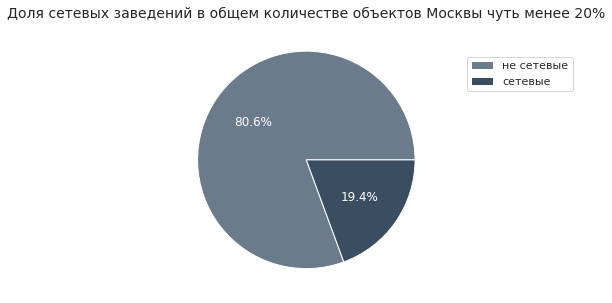

In [14]:
fig, ax = plt.subplots(figsize=[10,5])

plt.pie(x=rest_data['chain'].value_counts(), autopct="%.1f%%", labels=['не сетевые', 'сетевые'], 
        colors=['#6b7b8c', '#3b4d61'], textprops={'color':"w"})
plt.title('Доля сетевых заведений в общем количестве объектов Москвы чуть менее 20%', fontsize=14)
plt.legend( bbox_to_anchor=(1.5,0.9))
plt.show()

In [15]:
rest_data['object_type'].unique()

array(['кафе', 'столовая', 'закусочная',
       'предприятие быстрого обслуживания', 'ресторан', 'кафетерий',
       'буфет', 'бар', 'магазин (отдел кулинарии)'], dtype=object)

Сделаем замену длинных наименований типов объектов

In [16]:
rest_data.loc[rest_data['object_type'] == 'предприятие быстрого обслуживания', 'object_type'] = 'фаст-фуд'
rest_data.loc[rest_data['object_type'] == 'магазин (отдел кулинарии)', 'object_type'] = 'магазин'

In [17]:
rest_data['number'].describe()

count   15281.00
mean       59.79
std        74.84
min         0.00
25%        14.00
50%        40.00
75%        80.00
max      1700.00
Name: number, dtype: float64

Данные по среднему количеству посадочных мест больше медианного значения, значит, данные имеют положительную асимметрию и мы будем наблюдать длинный хвост и перекос вправо. Среднее заведение Москвы предлагает посетителям 40 посадочных мест.

In [18]:
rest_data_0_number = rest_data[rest_data['number'] == 0]
len(rest_data_0_number)

1588

In [19]:
(rest_data_0_number.groupby('object_type')['object_name'].count().reset_index()
 .sort_values('object_name', ascending=False).style.bar(color='#ced7d8'))

,object_type,object_name
8,фаст-фуд,690
3,кафе,306
2,закусочная,181
5,магазин,145
4,кафетерий,111
1,буфет,64
6,ресторан,44
0,бар,28
7,столовая,19


Около 10% заведений не имеют посадочных мест (1588 штук), преимущественно это предприятия быстрого обслуживания, имеющего только окошко для принятия и выдачи заказов, но также довольно большая часть заведений без посадочных мест имеет тип кафе (306 шт, 19% от заведений без посадочных мест), вероятнее, всего это точки, предлагающие кофе. И фаст-фуд и кафе без посадочных мест предположительно в большей массе располагаются в торговых комплексах в зоне фуд-кортов.

In [20]:
rest_data[rest_data['number'] == 1700]

,object_name,chain,object_type,address,number
12723,arena by soho family,нет,бар,"город Москва, Кутузовский проспект, дом 36, ст...",1700


Максимальное количество посадочных мест наблюдаем у арены, так что 1700 посадочных мест не является ошибкой в этом случае.

In [21]:
print('Уникальных адресов:', len(rest_data['address'].unique()))

Уникальных адресов: 9108


<a id='start_conclusion'></a>
## Вывод по пункту 1

Полученные в датасете данные содержат информацию о заведениях общественного питания Москвы.   
После приведения названий точек к нижнему регистру и удаления информации об идентификаторе были выявлены дублирующиеся строки.
Подготовленные к анализу данные без дублей и идентификаторов содержатся в датафрейме `rest_data`.

In [22]:
rest_data.head()

,object_name,chain,object_type,address,number
0,сметана,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48
1,родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35
2,кафе «академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95
3,пиццетория,да,кафе,"город Москва, Абрамцевская улица, дом 1",40
4,кафе «вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50


В результате предварительного знакомства с данными мы располагаем информацией:

- количество анализируемых уникальных заведений составляет 15280 штук
- почти 20% заведений имеют статус сетевых
- каждый объект питания относится к одному из 9 типов ('кафе', 'фаст-фуд', 'столовая', 'закусочная', 'ресторан', 'кафетерий', 'буфет', 'бар', 'магазин')
- среднее заведение Москвы предлагает посетителям 40 посадочных мест (распределение от 0 до 1700 мест)
- около 10% заведений не имеют посадочных мест (преимущественно фаст-фуд и кафе), предположительно они могут быть расположены в большей массе в торговых центрах на фуд-кортах

Данные готовы к проведению исследовательского анализа. Для более полной картины добавим из внешних источников информацию по геолокации каждой из точек.

<a id='geolocation'></a>
## 2 Добавление геолокационных данных. Выделение улиц

In [23]:
# код, с помощью которого получила данные по геолокации

#! pip install -U googlemaps -q
#import googlemaps
#from datetime import datetime

#set_addresses = set(rest_data['address'])
#result = {}
#geo_s ='https://maps.googleapis.com/maps/api/geocode/json'

#for address in set_addresses:
#    param = {'address': address, 'key': 'my_key', 'language' : 'ru'}
#    response = requests.get(geo_s, params=param)
#    result[address] = response.json()

#pd.DataFrame(result).to_csv('out.csv', index=True)

In [24]:
#out = pd.read_csv('out.csv')

In [25]:
spreadsheet_id = '1-qVq7JpNsGjtRcJeVhtngpDNIYhzSFhkUQrLbulIbzg'
file_name = 'https://docs.google.com/spreadsheets/d/{}/export?format=csv'.format(spreadsheet_id)
r = requests.get(file_name)
out = pd.read_csv(BytesIO(r.content))

In [26]:
result_df = out.T.iloc[2:]
result_df.reset_index(inplace=True)
result_df.columns = ['address', 'results', 'status']
result_df.head()

,address,results,status
0,"город Москва, улица Марии Ульяновой, дом 9, ко...",[{'address_components': [{'long_name': '9 корп...,OK
1,"город Москва, город Зеленоград, корпус 1519",[{'address_components': [{'long_name': 'Корпус...,OK
2,"город Москва, улица Барболина, дом 1","[{'address_components': [{'long_name': '1', 's...",OK
3,"город Москва, 3-й Дорожный проезд, дом 6А","[{'address_components': [{'long_name': '6А', '...",OK
4,"город Москва, улица Народного Ополчения, дом 4...",[{'address_components': [{'long_name': '48 кор...,OK


Выделим из ответа googlemaps данные по координатам, форматированному адресу и району.

In [27]:
result_df['lat'] = 0
result_df['lng'] = 0
result_df['formatted_address'] = 0
result_df['district'] = 0

In [28]:
for i in range(len(result_df)):
    try:
        result_df['lat'].iloc[i] = eval(result_df['results'][i])[0]['geometry']['location']['lat']
        result_df['lng'].iloc[i] = eval(result_df['results'][i])[0]['geometry']['location']['lng']
        result_df['formatted_address'].iloc[i] = eval(result_df['results'][i])[0]['formatted_address']
        result_df['district'].iloc[i] = eval(result_df['results'][i])[0]['address_components'][4]['long_name']
    except: continue

Проверим, есть ли информация по всем объектам

In [29]:
result_df[result_df['lat'] == 0]

,address,results,status,lat,lng,formatted_address,district
7619,"Проектируемый проезд N 5231, дом 8, строение 3",[],ZERO_RESULTS,0.00,0.00,0,0


In [30]:
result_df[result_df['lng'] == 0]

,address,results,status,lat,lng,formatted_address,district
7619,"Проектируемый проезд N 5231, дом 8, строение 3",[],ZERO_RESULTS,0.00,0.00,0,0


In [31]:
result_df[result_df['formatted_address'] == 0]

,address,results,status,lat,lng,formatted_address,district
7619,"Проектируемый проезд N 5231, дом 8, строение 3",[],ZERO_RESULTS,0.00,0.00,0,0


In [32]:
result_df[result_df['district'] == 0]

,address,results,status,lat,lng,formatted_address,district
561,"город Москва, шоссе Энтузиастов, домовладение ...",[{'address_components': [{'long_name': 'шоссе ...,OK,55.77,37.82,"ш. Энтузиастов, Москва, Россия",0
882,"город Москва, город Зеленоград, проезд № 4801,...",[{'address_components': [{'long_name': 'Зелено...,OK,55.99,37.20,"Зеленоград, Москва, Россия",0
2680,"город Москва, посёлок Акулово, дом 43А, строен...",[{'address_components': [{'long_name': 'Акулов...,OK,56.01,37.80,"Акулово, Москва, Россия",0
4816,"город Москва, город Зеленоград, проезд № 4801,...",[{'address_components': [{'long_name': 'Зелено...,OK,55.99,37.20,"Зеленоград, Москва, Россия",0
5441,"город Москва, 73-й километр Московской Кольцев...",[{'address_components': [{'long_name': 'МКАД 7...,OK,55.87,37.42,"МКАД 73 км (внешн.), Россия",0
5526,"город Москва, поселение Воскресенское, посёлок...",[{'address_components': [{'long_name': 'Воскре...,OK,55.53,37.45,"Воскресенское, Московская обл., Россия",0
6083,"город Москва, 74-й километр Московской Кольцев...",[{'address_components': [{'long_name': 'МКАД 7...,OK,55.88,37.44,"МКАД 74 км (внешн.), Химки, Россия",0
7619,"Проектируемый проезд N 5231, дом 8, строение 3",[],ZERO_RESULTS,0.00,0.00,0,0
8019,"город Москва, Каскадная улица, домовладение 21...",[{'address_components': [{'long_name': 'улица ...,OK,55.71,37.87,"ул. Каскадная, Москва, Россия",0
8730,"город Москва, поселение Воскресенское, посёлок...",[{'address_components': [{'long_name': 'Воскре...,OK,55.53,37.45,"Воскресенское, Московская обл., Россия",0


Почти по всем объектам геолокационная информация была найдена, используем ее применительно к датасету с объектами питания

Выделим в отдельный столбец информацию об улице

In [33]:
result_df['street'] = result_df['formatted_address'].str.split(pat = r'\,', expand=True)[0]

In [34]:
len(result_df[~result_df['street']
              .fillna('').str
              .contains(r'улица|ул\.|переулок|пер\.|ш\.|проспект|пр\.|просп\.|пр-т|пл\.|проезд|пр-д|аллея|ал\.|бул\.|б-р|набережная|наб\.|туп\.|линия|лин\.|просек|кв-л|километр|км|Километр')]
   )

302

Для 302 адресов улица не была выделена в явном виде, в большей степени это близлежайшие к Москве населенные пункты, которые не являются целевыми объектами в рамках нашего анализа, так как такое специфичное заведение как робо-кафе нет смысла открывать в удаленных районах.

In [35]:
rest_data = rest_data.merge(result_df[['address', 'district', 'street']], on='address')

In [36]:
len(rest_data['street'].unique())

2133

In [37]:
rest_data.head()

,object_name,chain,object_type,address,number,district,street
0,сметана,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48,Ярославский,ул. Егора Абакумова
1,родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35,Таганский,Талалихина ул.
2,кафе «академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95,Таганский,Абельмановская ул.
3,пиццетория,да,кафе,"город Москва, Абрамцевская улица, дом 1",40,Лианозово,Абрамцевская ул.
4,кафе «вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50,Лианозово,Абрамцевская ул.


Исправим названия районов для того, чтобы в дальнейшем иметь возможность нанести их на карту

In [38]:
rest_data.loc[rest_data['district'] == 'Тропарево-никулино', 'district'] = 'Тропарёво-Никулино'
rest_data.loc[rest_data['district'] == 'Нагатино-садовники', 'district'] = 'Нагатино-Садовники'
rest_data.loc[rest_data['district'] == 'Фили-давыдково', 'district'] = 'Фили-Давыдково'
rest_data.loc[rest_data['district'] == 'Москворечье-сабурово', 'district'] = 'Москворечье-Сабурово'
rest_data.loc[rest_data['district'] == 'Теплый Стан', 'district'] = 'Тёплый Стан'
rest_data.loc[rest_data['district'] == 'Черемушки', 'district'] = 'Черёмушки'
rest_data.loc[rest_data['district'] == 'Хорошевский', 'district'] = 'Хорошёвский'
rest_data.loc[rest_data['district'] == 'проспект Вернадского', 'district'] = 'Проспект Вернадского'
rest_data.loc[rest_data['district'] == 'Орехово-борисово Южное', 'district'] = 'Орехово-Борисово Южное'
rest_data.loc[rest_data['district'] == 'Орехово-борисово Северное', 'district'] = 'Орехово-Борисово Северное'
rest_data.loc[rest_data['district'] == 'Хорошево-мневники', 'district'] = 'Хорошёво-Мнёвники'
rest_data.loc[rest_data['district'] == 'Савеловский', 'district'] = 'Савёловский'
rest_data.loc[rest_data['district'] == 'Ново-переделкино', 'district'] = 'Ново-Переделкино'
rest_data.loc[rest_data['district'] == 'Бирюлево Восточное', 'district'] = 'Бирюлёво Восточное'
rest_data.loc[rest_data['district'] == 'Выхино-жулебино', 'district'] = 'Выхино-Жулебино'
rest_data.loc[rest_data['district'] == 'Косино-ухтомский', 'district'] = 'Косино-Ухтомский'
rest_data.loc[rest_data['district'] == 'Покровское-стрешнево', 'district'] = 'Покровское-Стрешнево'
rest_data.loc[rest_data['district'] == 'Филевский Парк', 'district'] = 'Филёвский Парк'
rest_data.loc[rest_data['district'] == 'Очаково-матвеевское', 'district'] = 'Очаково-Матвеевское'

In [39]:
rest_street = rest_data.groupby('street')['object_name'].count().reset_index()
rest_street.columns = ['street', 'count_objects']
rest_street.tail()

,street,count_objects
2127,улица Горького,1
2128,улица Серпуховский Вал,2
2129,фабрики им. 1-го Мая,3
2130,ш. Фрезер,1
2131,ш. Энтузиастов,47


<a id='geo_conclusion'></a>
## Вывод по пункту 2

In [40]:
m = folium.Map([55.76, 37.57], zoom_start=10)

for index, row in result_df.iterrows():
    folium.CircleMarker([row['lat'], row['lng']],
                        radius=0.01,
                        fill_opacity=0.1,
                        
                       ).add_to(m)

m.add_child(HeatMap(result_df[['lat', 'lng']].values, fill_opacity=0.5, radius=15))
m.save('map_0.html')
m

Наибольшее скопление объектов общественного питания ожидаемо находится в историческом центре Москвы, к окраинам точки более рассредоточены. Однако в целом во всех районах конкуренция в срефе общепита значительная.

<a id='analysis'></a>
## 3. Исследовательский анализ данных

<a id='values'></a>
### 3.1 Соотношение видов объектов общественного питания по количеству

In [41]:
rest_data_by_type = rest_data['object_type'].value_counts().reset_index()
rest_data_by_type['part'] = rest_data_by_type['object_type'] / rest_data_by_type['object_type'].sum()
rest_data_by_type

,index,object_type,part
0,кафе,6069,0.40
1,столовая,2584,0.17
2,ресторан,2282,0.15
3,фаст-фуд,1897,0.12
4,бар,855,0.06
5,буфет,576,0.04
6,кафетерий,395,0.03
7,закусочная,348,0.02
8,магазин,273,0.02


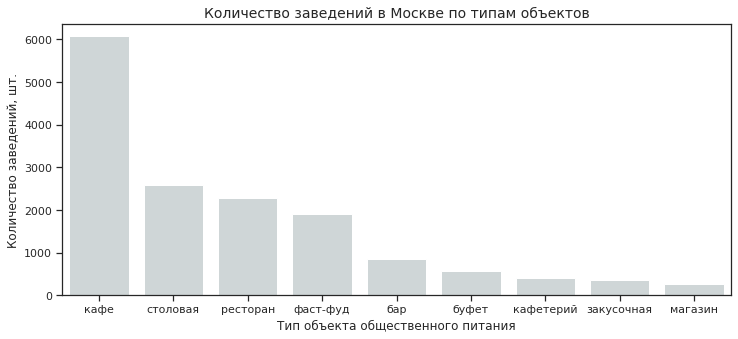

In [42]:
plt.figure(figsize=(12,5))
sns.barplot(data=rest_data_by_type, x='index', y='object_type', color='#ced7d8')
plt.title('Количество заведений в Москве по типам объектов', fontsize=14)
plt.xlabel('Тип объекта общественного питания')
plt.ylabel('Количество заведений, шт.')
plt.show()

Наибольшая доля среди заведений Москвы - это кафе, 40% от общего количества предприятий питания (6071 точка). Следующие 3 места с большим отрывом от лидера занимают столовые (2584 шт, 17%), рестораны (2282 шт, 15%) и фаст-фуды (1897 шт, 12%). Оставшиеся 5 видов питания не такие многочисленные, их суммарный объем составляет 17% всех заведений столицы.


   На популярности типа кафе могут сказываться несколько факторов:
   - это, пожалуй, наиболее популярный формат у посетителей (и покушать, и посидеть, и поработать)
   - это привлекательный формат и для владельцев - открыть кафе относительно проще, чем, скажем, бар (не нужна, например, алкогольная лицензия), проще, чем оборудовать столовую на 130 мест и проще, чем ресторан, где нужно серьезно вложиться в разработку меню.

<a id='chain'></a>
### 3.2 Сетевые и несетевые заведения по количеству и видам объектов общественного питания

При первоначальном взгляде на данные было выявлено, что в целом сетевые заведения составляют около 20% всех анализируемых предприятий общественного питания. Рассмотрим распространение сетевых заведний в зависимости от типа объектов питания.

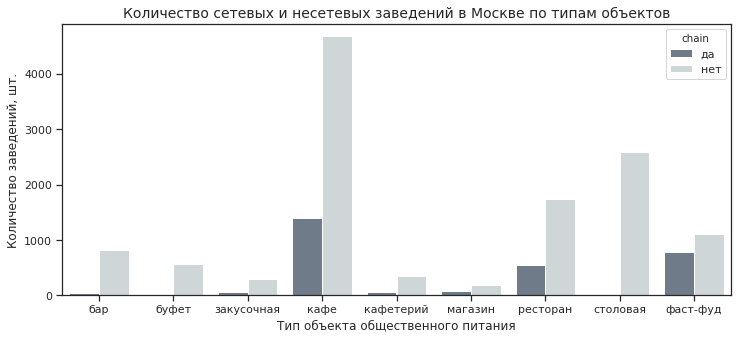

In [43]:
data = rest_data.groupby(['object_type', 'chain']).count()
data = data.reset_index()
plt.figure(figsize=(12,5))
sns.barplot(data=data, x='object_type', y='object_name', hue='chain', palette=['#6b7b8c', '#ced7d8'])
plt.title('Количество сетевых и несетевых заведений в Москве по типам объектов', fontsize=14)
plt.xlabel('Тип объекта общественного питания')
plt.ylabel('Количество заведений, шт.')
plt.show()

Сетевые объекты чаще всего встречаются среди кафе, фаст-фуда и ресторанов. Посмотрим на относительные доли сетевых заведtний в каждом из типов общественного питания.

In [44]:
rest_pivot = rest_data.pivot_table(index='object_type', columns='chain', values='object_name', aggfunc='count').reset_index()
rest_pivot.columns = ['object_type', 'count_chain', 'count_no_chain']
rest_pivot['chain_part'] = rest_pivot['count_chain'] / (rest_pivot['count_chain'] + rest_pivot['count_no_chain'])
rest_pivot['no_chain_part'] = 1 - rest_pivot['chain_part']
rest_pivot = rest_pivot.sort_values('chain_part', ascending=False)
rest_pivot

,object_type,count_chain,count_no_chain,chain_part,no_chain_part
8,фаст-фуд,788,1109,0.42,0.58
5,магазин,78,195,0.29,0.71
6,ресторан,543,1739,0.24,0.76
3,кафе,1395,4674,0.23,0.77
2,закусочная,56,292,0.16,0.84
4,кафетерий,52,343,0.13,0.87
0,бар,37,818,0.04,0.96
1,буфет,11,565,0.02,0.98
7,столовая,3,2581,0.00,1.00


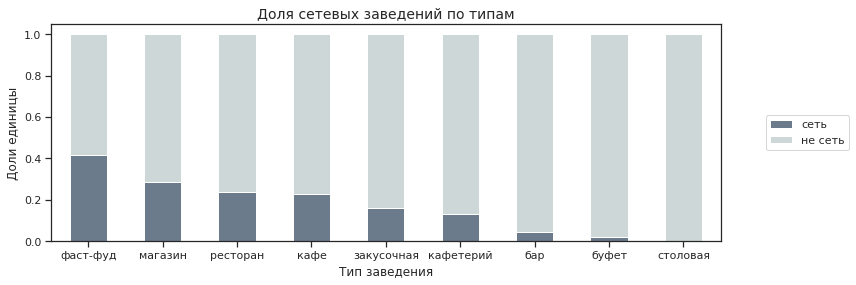

In [45]:
fig, ax = plt.subplots()
(rest_pivot[['object_type', 'chain_part', 'no_chain_part']]
 .plot(kind='bar', stacked=True, figsize=(12,4), ax=ax, color=['#6b7b8c', '#ced7d8']))
handles, labels = ax.get_legend_handles_labels()
labels = ['сеть', 'не сеть']
lgd = ax.legend(handles, labels, loc=5, bbox_to_anchor=(1.2,0.5))
ax.set_xticklabels(rest_pivot['object_type'], rotation=0)
plt.title("Доля сетевых заведений по типам", fontsize=14)
plt.xlabel("Тип заведения")
plt.ylabel("Доли единицы")
plt.show()

Несмотря на то, что наибольшее количество сетевых точек относятся к типу кафе (1396 шт.), их доля среди заведений с типом кафе составляет лишь 23% и это сопоставимо с долей сетевых ресторанов (24%, что составляет 543 сетевых ресторана). А вот наибольшие доли сетей можно видеть среди заведений фаст-фуда (42%, 788 точек) и кулинарий при магазинах (29%, 78 точек). И это вполне закономерно, ведь именно среди точек с фаст-фудом наиболее распространена работа по франшизе и это является, пожалуй, самым легким способом для развития сети.

<a id='sign_of_chain'></a>
### 3.3 Характерные признаки сетевых заведений

Рассмотрим, что характерно для сетевых заведений по количеству посадочных мест и числу объектов в разрезе типов заведений

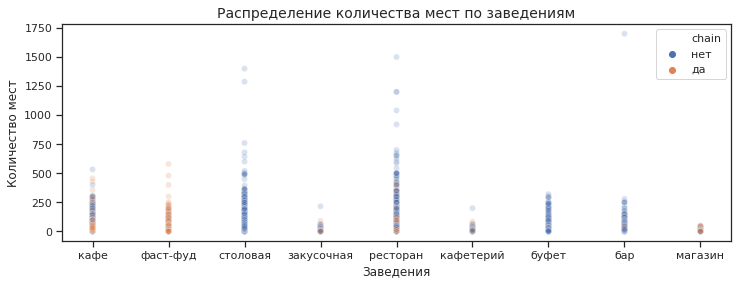

In [46]:
fig, ax = plt.subplots(figsize=(12,4))
sns.scatterplot(data=rest_data, x='object_type', y='number', hue='chain', alpha=0.2)
plt.title('Распределение количества мест по заведениям', fontsize=14)
plt.xlabel('Заведения')
plt.ylabel('Количество мест')
plt.show()

Среди тех типов заведений, где довольно значительная часть является сетями, заметно, что нижняя часть на графике - это сети, то есть количество мест в сетевых заведениях обычно меньше, чем в несетевых.

Выделим в отдельный датафрейм сетевые заведения

In [47]:
rest_chain_data = rest_data[rest_data['chain'] == 'да']

In [48]:
rest_chain_data.head()

,object_name,chain,object_type,address,number,district,street
3,пиццетория,да,кафе,"город Москва, Абрамцевская улица, дом 1",40,Лианозово,Абрамцевская ул.
7,брусника,да,кафе,"город Москва, переулок Сивцев Вражек, дом 6/2",10,Арбат,Сивцев Вражек переулок
14,алло пицца,да,кафе,"город Москва, улица Авиаторов, дом 14",32,Солнцево,ул. Авиаторов
17,суши wok,да,фаст-фуд,"город Москва, Азовская улица, дом 3",7,Зюзино,ул. Азовская
20,тануки,да,ресторан,"город Москва, Большая Академическая улица, дом 65",160,Коптево,ул. Большая Академическая


Сгруппируем сети по наименованию, чтобы посмотреть среднее количество точек на сеть.   
Конечно, при данном способе не удастся сгруппировать в сеть объекты, имеющие разные наименования, но самые большие сетевые франшизы удастся собрать.

In [49]:
group_chain = rest_chain_data.copy()
group_chain = group_chain.groupby('object_name').agg({'address' : 'count', 'number' : 'mean'}).reset_index()
group_chain.sort_values('address', ascending=False)

,object_name,address,number
562,шоколадница,157,57.18
25,kfc,155,55.34
330,макдоналдс,150,87.70
109,бургер кинг,137,46.65
520,теремок,94,25.61
...,...,...,...
243,кафе «хлеб насущный»,1,38.00
241,кафе «урюк» хивинская чайхона,1,50.00
240,кафе «торнадо»,1,80.00
237,кафе «тапчан»,1,70.00


In [50]:
round(group_chain[group_chain['address'] > 1]['address'].mean(),)

11

In [51]:
rest_chain_data.describe()

,number
count,2963.00
mean,52.99
std,57.16
min,0.00
25%,15.00
50%,40.00
75%,72.00
max,580.00


Как и ожидалось, наиболее многочисленные сети - это франшизы (Шоколадница, KFC, Макдоналдс, Бургер Кинг и Теремок).    
В среднем в сетях 11 заведений и 40 посадочных мест, то есть относительно большое число заведений и относительно небольшое количество посадочных мест.

<a id='average_of_seats'></a>
### 3.4 Среднее количество посадочных мест

In [52]:
rest_mean_number = rest_data.groupby('object_type').agg({'number' : ['mean', 'median'], 'object_name' : 'count'}).reset_index()
rest_mean_number.columns = ['object_type', 'mean_number', 'median_number', 'count_objects']
rest_mean_number = rest_mean_number.sort_values('mean_number', ascending=False)
rest_mean_number.style.format({'mean_number': "{:.0f}"}).bar(color='#ced7d8')

,object_type,mean_number,median_number,count_objects
7,столовая,130,103,2584
6,ресторан,97,80,2282
1,буфет,51,32,576
0,бар,44,35,855
3,кафе,40,30,6069
8,фаст-фуд,21,6,1897
4,кафетерий,9,6,395
2,закусочная,8,0,348
5,магазин,6,0,273


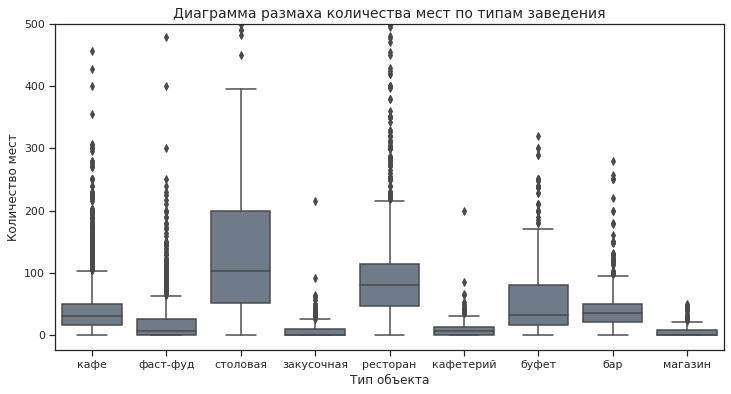

In [53]:
plt.figure(figsize=(12,6))
plt.ylim(-25, 500)
sns.boxplot(data=rest_data, x='object_type', y='number', color='#6b7b8c')
plt.title('Диаграмма размаха количества мест по типам заведения', fontsize=14)
plt.xlabel('Тип объекта')
plt.ylabel('Количество мест')
plt.show()

Наибольшим средним количеством посадочных мест (103 места), но при этом и наибольшим размахом усов, отличаются столовые. Такое лидерство может объясняться тем, что данный тип заведения чаще всего привязан к какому-то конкретному учреждению и обслуживает посетителей в определенные часы, например, в обед, соответственно, нужно большое количество мест, чтобы расположить одномоментно сотрудников учреждения. 

В среднем ресторане также довольно большой зал (на 80 посадочных мест). В ресторанах обычно не такой большой поток в течение дня, и люди воспринимают это место не только как пункт приема пищи, но и как место приятного отдыха, поэтому проводят здесь значительное количество времени, столики освобождаются не так быстро, поэтому для увеличения пропускной способности заведения необходимо значительное количество посадочных мест.

Типичные бары, буфеты и кафе располагают от 30 до 35 посадочных мест, что уравновешивается потоком посетителей и относительно более равномерным спросом в течение дня.

<a id='top'></a>
### 3.5 Топ-10 улиц по количеству объектов общественного питания

In [54]:
rest_top_10_street = rest_street.sort_values('count_objects', ascending=False).head(10)
rest_top_10_street

,street,count_objects
1606,пр-т Мира,203
1997,ул. Профсоюзная,181
783,Ленинградский пр-т.,172
465,Варшавское ш.,156
1114,Пресненская наб.,150
786,Ленинский пр-т.,149
1614,пр. Вернадского,128
771,Кутузовский просп.,113
686,Каширское ш.,111
694,Кировоградская ул.,108


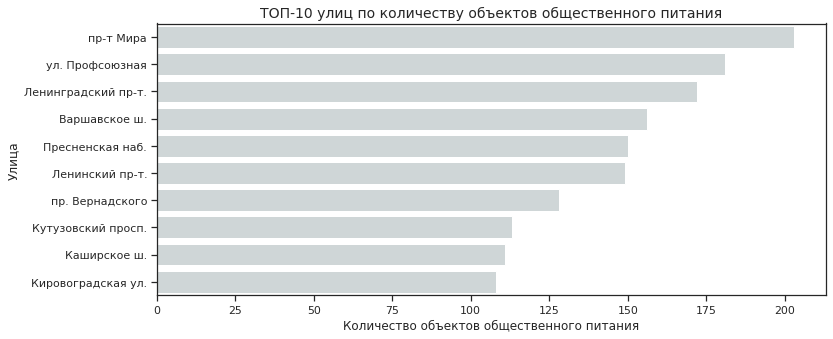

In [55]:
plt.figure(figsize=(12,5))
sns.barplot(data=rest_top_10_street, x='count_objects', y='street', color='#ced7d8')
plt.title('ТОП-10 улиц по количеству объектов общественного питания', fontsize=14)
plt.xlabel('Количество объектов общественного питания')
plt.ylabel('Улица')
plt.show()

   На графике приведены 10 наиболее популярных улиц в Москве, отсортированные по убыванию числа заведений. На наиболее популярной улице (пр. Мира) расположено 206 объектов, что почти в 2 раза больше, чем на Кировоградской улице, занимающей последнее место в топе 10 улиц со 108 заведениями.
    
   Наиболее популярной улицей с точки зрения расположения объектов питания является проспект Мира, в первую очередь за счет своей протяженности и расположения в 6 районах, начиная с ЦАО невдалеке от исторического центра и популярных достопримечательностей.     
   
   На втором месте по количеству заведений - Профсоюзная улица, она по протяженности сопоставима с проспектом Мира, но ее расположение несколько удалено от исторического центра, возможно, поэтому количество заведений на 11% ниже, чем на самой популярной улице.    
    
   Ленинградский проспект, находящийся на 3 месте, является одной из важнейших транспортных магистралей столицы, и пусть его протяженность на 40% меньше, чем у первых двух улиц, но за счет наличия таких значимых объектов как аэропорт «Шереметьево», стадион «Динамо», а также нескольких крупных высших учебных заведений, является популярным местом для открытия точек общественного питания, а в учебных заведениях - столовых и кафе.
    
   Таким образом, один из основных критериев для улиц, определяющих их популярность - это, в первую очередь, протяженность и нахождение в нескольких районах (даже по наименованию мы можем это понять - в топе не так уж много улиц, сплошные проспекты и шоссе), что позволяет аккумулировать заведения вблизи "центров притяжения", которые в каждом районе могут быть разными по типам (достопримечательности, учебные заведения, транспортные узлы - аэропорты/вокзалы, арены/стадионы, бизнес- или торговые центры).
    

In [56]:
rest_top_10_street['count_objects'].sum()

1471

In [57]:
mask = r'пр-т Мира|ул. Профсоюзная|Ленинградский пр-т.|Варшавское ш.|Пресненская наб.|Ленинский пр-т.|пр. Вернадского|Кутузовский просп.|Каширское ш.|Кировоградская ул.'
rest_top = rest_data[rest_data['street'].fillna('').str.contains(mask)]
rest_top.head()

,object_name,chain,object_type,address,number,district,street
174,кафе «андерсон»,да,кафе,"город Москва, Варшавское шоссе, дом 2",150,Донской,Варшавское ш.
175,кальян бар,нет,бар,"город Москва, Варшавское шоссе, дом 2",24,Донской,Варшавское ш.
176,кафе «subway»,да,кафе,"город Москва, Варшавское шоссе, дом 7, корпус 1",36,Донской,Варшавское ш.
177,кафе суши wok,да,фаст-фуд,"город Москва, Варшавское шоссе, дом 7, корпус 1",8,Донской,Варшавское ш.
178,кафе «doner city»,нет,фаст-фуд,"город Москва, Варшавское шоссе, дом 7, корпус 1",1,Донской,Варшавское ш.


In [58]:
rest_top_district = (rest_top.groupby('district')['address'].count()
                     .reset_index().sort_values('address', ascending=False))
rest_top_district

,district,address
18,Пресненский,150
29,Чертаново Центральное,90
24,Тропарёво-Никулино,86
9,Мещанский,64
14,Обручевский,64
22,Свиблово,62
3,Беговой,60
6,Дорогомилово,60
12,Нагатино-Садовники,57
2,Аэропорт,56


Для наглядности нанесем районы, где располагается ТОП-10 улиц с наибольшим количеством объектов общественного питания, на карту Москвы

In [59]:
m = folium.Map(location=[55.76, 37.57], zoom_start=10)
url = 'http://gis-lab.info/data/mos-adm/mo.geojson'
geo_data = requests.get(url).json()
data = rest_top_district
choropleth = folium.Choropleth(geo_data=geo_data, data=data, columns=['district', 'address'],
                  name='choropleth', key_on="feature.properties.NAME",
                  fill_color='YlGn', fill_opacity=0.7, highlight=True, line_opacity=0.2, line_color='black'
                 ).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['NAME'], labels=False)
)

folium.LayerControl(collapsed=True).add_to(m)

m.save('map.html')
m

На карте цветом выделены районы, в которых проходят улицы с наибольшим количеством точек общественного питания. Наиболее насыщенный - Пресненский район, вероятно это может быть связано с расположением в этом районе Москва Сити. Исторический центр Москвы почти не попал в данный топ, напротив, попали районы, находящиеся ближе к МКАДу, возможно, это те районы, где располагаются торговые и бизнес-центры, количество заведений в которых велико.

<a id='one'></a>
### 3.6 Улицы с одним объектом общественного питания

In [60]:
rest_1_objects_per_street = rest_street[rest_street['count_objects'] == 1]
len(rest_1_objects_per_street)

715

714 объектов в единственном числе расположены на какой-либо из улиц, что составляет ~5% от всего количества объектов питания и 33% от количества уникальных улиц

In [61]:
rest_1_objects_per_street = (rest_1_objects_per_street
                             .merge(rest_data[['street', 'district']], on='street'))

In [62]:
rest_1_objects_per_street.head()

,street,count_objects,district
0,1-й Балтийский пер.,1,Аэропорт
1,1-й Басманный пер.,1,Красносельский
2,1-й Ботанический пр.,1,Свиблово
3,1-й Голутвинский пер.,1,Якиманка
4,1-й Зачатьевский пер.,1,Хамовники


In [63]:
rest_1_objects_district = (rest_1_objects_per_street.groupby('district')['count_objects'].count()
                           .sort_values(ascending=False).reset_index())
rest_1_objects_district = rest_1_objects_district[~rest_1_objects_district['district'].isin(['Москва', 'Россия']) ]
rest_1_objects_district

,district,count_objects
1,Хамовники,28
2,Таганский,25
3,Басманный,22
5,Пресненский,20
6,Тверской,20
...,...,...
115,Западное Дегунино,1
116,Коньково,1
117,Ивановское,1
118,Перово,1


In [64]:
m = folium.Map(location=[55.76, 37.57], zoom_start=10)
url = 'http://gis-lab.info/data/mos-adm/mo.geojson'
geo_data = requests.get(url).json()
data_rest_1 = rest_1_objects_district
choropleth = folium.Choropleth(geo_data=geo_data, data=data_rest_1, columns=['district', 'count_objects'],
                  name='choropleth', key_on="feature.properties.NAME",
                  fill_color='YlGn', fill_opacity=0.7, highlight=True, line_opacity=0.2, line_color='black'
                 ).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['NAME'], labels=False)
)

folium.LayerControl(collapsed=True).add_to(m)

m.save('map_1.html')
m

По одному заведению на улицу по большей части наблюдается в районах исторического центра Москвы (Таганский, Хамовники, Басманный, Тверской, Пресненский). Но в целом почти в любом районе Москвы есть улицы, где расположены по одному заведению общественного питания, но на окраинах их количество меньше, чем в центре. В противоположность топ-10 улиц, здесь сосредоточены небольшие улицы и переулки, и таких коротких улиц по всей Москве очень много.

<a id='seat_top'></a>
### 3.7 Количество посадочных мест для улиц с большим количеством объектов общественного питания

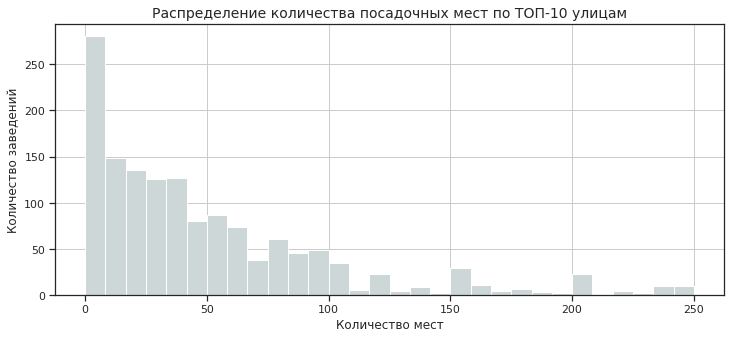

In [65]:
rest_top['number'].hist(bins=30, range=(0, 250), figsize=(12,5), color='#ced7d8')
plt.title('Распределение количества посадочных мест по ТОП-10 улицам', fontsize=14)
plt.xlabel('Количество мест')
plt.ylabel('Количество заведений')
plt.show()

  
   На гистограмме распределения количества посадочных мест на топ-10 улицах видно, что более 250 заведений имеет количество мест в промежутке от 0 до 8, а основная масса заведений располагает до 108 посадочных мест. Получается, на самых популярных улицах хоть и много заведений, но они небольшие.

In [66]:
rest_top_mean = rest_top.groupby('street').agg({'number' : ('mean', 'median')}).reset_index()
rest_top_mean.columns= ['street', 'mean_number', 'median_number']
rest_top_mean

,street,mean_number,median_number
0,Варшавское ш.,54.29,31.00
1,Каширское ш.,55.50,25.00
2,Кировоградская ул.,59.79,30.00
3,Кутузовский просп.,85.37,40.00
4,Ленинградский пр-т.,52.34,40.00
5,Ленинский пр-т.,63.13,45.00
6,Пресненская наб.,41.64,28.50
7,пр-т Мира,63.00,48.00
8,пр. Вернадского,68.80,40.00
9,ул. Профсоюзная,47.75,24.00


In [67]:
round(rest_top_mean['median_number'].mean())

35

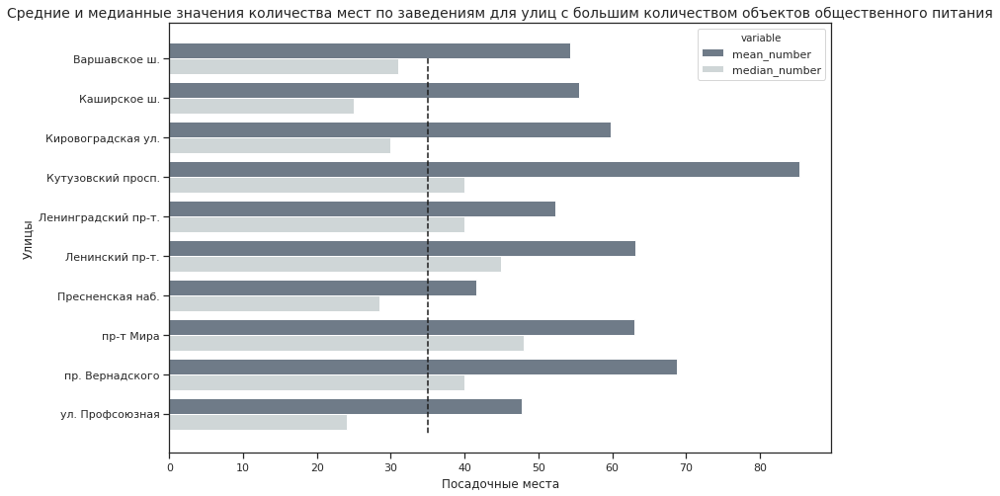

In [68]:
plt.figure(figsize=(12,8))
sns.barplot(data=rest_top_mean.melt(id_vars='street'), y='street', x='value', hue='variable', palette=['#6b7b8c', '#ced7d8'])
plt.vlines(35, 0, 9.5, linestyles='dashed')
plt.title('Средние и медианные значения количества мест по заведениям для улиц с большим количеством объектов общественного питания', fontsize=14)
plt.ylabel('Улицы')
plt.xlabel('Посадочные места')
plt.show()

Медианное количество посадочных мест в заведениях на ТОП-10 улицах не превышает 50 штук, а в среднем составляет 35 единиц. Учитывая, что большое скопление заведений может присутствовать в торговых или бизнес-центрах, такое количество посадочных мест оправдано значительным и относительно равномерным потоком клиентов в течние дня.

<a id='analys_conclusion'></a>
## Вывод по пункту 3

Среди всех заведений Москвы чаще всего встречается тип кафе (40%), с большим отрывом опережающий столовые, рестораны и предприятия быстрого обслуживания (17%, 15% и 12% соответственно). 

Доля сетей среди кафе составляет 23%, тогда как лидирует фаст-фуд, где доля сетевого распространения составляет 42%. Самые многочисленные сети - это франшизы фаст-фуда и кофеен, где характерно относительно большое число заведений при относительно небольшом количестве посадочных мест (40 единиц). 

Наибольшим же средним количеством мест отличаются столовые и рестораны (103 и 80 посадочных мест соответственно), а типичные бары, буфеты и кафе располагают от 30 до 35 посадочных мест, что является отражением специфики обслуживания и поведения посетителей в каждом из типов предприятий питания.

Наибольшее количество точек общественного питания на одну улицу находятся предположительно в районах, где располагаются торговые и бизнес-центры, например, Пресненский район с Москва-Сити. Этим же может объясняться среднее количество посадочных мест, составляющее всего 35 единиц.

На 33% улиц располагается только одно заведение, причем доля таких заведений составляет всего около 5% от общего количества объектов питания. Такие улицы наблюдаются почти во всех районах Москвы, в большей степени в центральной части, в меньшей степени на окраинах.

<a id='total_conclusion'></a>
## Общий вывод. Рекомендации

Для целей проекта был проведен анализ 15280 заведений общественного питания Москвы.

Основные характеристики рынка общепита:
- во всех районах Москвы конкуренция в сфере общепита значительная, наибольшее скопление точек - в историческом центре Москвы
- наибольшая доля среди заведений Москвы - это кафе (40%), фаст-фуд занимает 12% всех заведений
- почти 20% заведений имеют статус сетевых (среди кафе 23% сетевых, фаст-фуд 42% сетевых)
- наиболее многочисленные сети - это франшизы фаст-фуда и кофеен 
- типичное кафе располагает около 30 посадочных мест
- в центральных районах много улиц с одним заведением
- улицы с большим количеством объектов расположены в районах, где есть БЦ или ТЦ (количество посадочных мест в среднем около 35)

Исходя из результатов анализа были сформулированы рекомендации по открытию робо-кафе:
1. Предпочтительным типом заведения будет кафе как наиболее популярный тип среди остальных, либо фаст-фуд как наиболее простой вариант для вхождения на рынок и дающий возможность для развития сети, в этом случае стоит обратить внимание на популярные франшизы (Шоколадница, KFC, Макдоналдс, Бургер Кинг и Теремок) и внедрить новый тип обслуживания - с помощью роботов.
2. Количество посадочных мест в размере 30-35 для типа кафе, либо рассмотреть возможность открытия на фуд-кортах торговых центров, если будет выбран тип фаст-фуд.
3. И для кафе и для фаст-фуда наиболее приемлемым вариантом расположения будет многолюдное место, например, около торгово-развлекательных комплексов или внутри них, вблизи бизнес-центров,  офисных зданий или учебных заведений. Районы - где расположены ТОП-10 улиц.
4. При выборе места следует учитывать наличие конкурентов поблизости.

По [ссылке](https://drive.google.com/file/d/1Xdm4G3myhFswNRAXfLh9IltRUjDova2J/view?usp=sharing) доступна презентация.